# Tracing Car Evolution with AI (Backend)

### **Note:** Replace **/content/sample_data/** with your preferred directory path for all instances mentioned below. Ensure the directory structure aligns with your project setup.
### If the model inference produces incorrect results, refresh the session or restart the kernel and run the entire code again from the beginning.

### Install packages (if required)

In [1]:
!pip install pillow-avif-plugin
!pip install Pillow

### Import necessary libraries

In [2]:
import pillow_avif
import cv2
import os
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import random
from torchvision import transforms, models
from torchvision.models.vision_transformer import vit_b_16
from torch.utils.data import Dataset, DataLoader
from PIL import Image

### Convert Images any format to any format (if needed)

In [3]:
name = "2023_genesis_g80_sedan_35t-sport_f_oem_4_1600x1067"

# Open an AVIF image
img = Image.open(f"/content/sample_data/Training_Images/{name}.avif")

# Display the image
img.show()

# Save the image in another format
img.save(f'/content/sample_data/Training_Images/JPEG/{name}.jpg')

### Resizing all images for consistent dimensions (**Entire Folder**)

In [4]:
# Function to resize the image to a fixed dimension (e.g., 1280x855)
def resize_image(image, target_size=(1280, 855)):
    """
    Resizes the image to the given target size.

    Args:
    - image: The input image.
    - target_size: A tuple (width, height) to resize the image to.

    Returns:
    - resized_image: The resized image with the target dimensions.
    """
    return cv2.resize(image, target_size)

# Function to save the final image
def save_image(image, output_path):
    """
    Save the final image to a file.

    Args:
    - image: The image to save.
    - output_path: The file path where the image will be saved.
    """
    cv2.imwrite(output_path, image)
    print(f"Image saved to {output_path}")

# Function to resize and save all images in a folder
def resize_images_in_folder(input_folder, output_folder, target_size=(1280, 855)):
    # Create the output folder if it does not exist
    os.makedirs(output_folder, exist_ok=True)

    # Loop through all files in the input folder
    for file_name in os.listdir(input_folder):
        # Check if the file is an image based on its extension
        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(input_folder, file_name)

            # Load the image in color (default)
            image = cv2.imread(image_path)

            # Resize the image to a fixed size
            resized_image = resize_image(image, target_size)

            # Define the output path for the resized image
            output_path = os.path.join(output_folder, file_name)

            # Save the resized image
            save_image(resized_image, output_path)

# Example usage
resize_images_in_folder(
    '/content/sample_data/Training_Images/JPEG',  # Input folder containing original images
    '/content/sample_data/Training_Images/Resized_Images',  # Output folder to save resized images
    target_size=(1280, 855)  # Target size for resizing
)

Image saved to /content/sample_data/Training_Images/Resized_Images/2025_toyota_camry_sedan_se_f_oem_1_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2023_toyota_corolla_sedan_se_fs_izmo_1_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2024_nissan_versa_sedan_s_exp_izmo_1_036_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2021_hyundai_elantra_sedan_limited_f_oem_1_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2024_toyota_camry_sedan_xle_f_oem_1_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2024_honda_accord_sedan_ex-l-hybrid_fs_izmo_1_1280x855.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2023_genesis_g80_sedan_35t-sport_f_oem_4_1600x1067.jpg
Image saved to /content/sample_data/Training_Images/Resized_Images/2024_hyundai_elantra_sedan_n-line_f_oem_1_1280x855.jpg
Image saved to /content/sample_data/

### Resizing all images for consistent dimensions (**One pic at a time**)

In [5]:
# Resize image
def resize_image(image_path, new_size):
    # Open the image
    image = Image.open(image_path)

    # Resize the image
    resized_image = image.resize(new_size)

    # Return the resized image
    return resized_image

# Resize the image to a new size
new_size = (1280,855)
resized_image = resize_image("/content/sample_data/Training_Images/JPEG/2024_mazda_3_sedan_25-s-preferred_fs_izmo_1_1280x855.jpg", new_size)

#Save the image
resized_image.save("/content/sample_data/Training_Images/Resized_Images/2024_mazda_3_sedan_25-s-preferred_fs_izmo_1_1280x855.jpg")

### Moving pictures you want to predict on, to a new folder named **Inference Images**

In [6]:
def move_file(source_path, target_folder):
    """
    Moves a file from source_path to target_folder.
    Creates the target folder if it does not exist.

    :param source_path: Path to the source file
    :param target_folder: Path to the target folder
    """
    try:
        # Check if the source file exists
        if not os.path.isfile(source_path):
            print(f"Source file does not exist: {source_path}")
            return

        # Create the target folder if it doesn't exist
        if not os.path.exists(target_folder):
            os.makedirs(target_folder)
            print(f"Created target folder: {target_folder}")

        # Get the file name
        file_name = os.path.basename(source_path)

        # Construct the target path
        target_path = os.path.join(target_folder, file_name)

        # Move the file
        shutil.move(source_path, target_path)
        print(f"File moved successfully from {source_path} to {target_path}")

    except Exception as e:
        print(f"Error moving file: {e}")

# Example usage
source_file = "/content/sample_data/Training_Images/JPEG/2025_audi_s3_sedan_prestige_f_oem_2_1600x1067.jpg"  # Replace with the path to your source file
target_directory = "/content/sample_data/Inference_Images"  # Replace with your target folder path

move_file(source_file, target_directory)

# Example usage
source_file = "/content/sample_data/Training_Images/JPEG/2022_audi_s3_sedan_prestige_f_oem_1_1600x1067.jpg"  # Replace with the path to your source file
target_directory = "/content/sample_data/Inference_Images"  # Replace with your target folder path

move_file(source_file, target_directory)

Source file does not exist: /content/sample_data/Training_Images/JPEG/2025_audi_s3_sedan_prestige_f_oem_2_1600x1067.jpg
Source file does not exist: /content/sample_data/Training_Images/JPEG/2022_audi_s3_sedan_prestige_f_oem_1_1600x1067.jpg


### If you want to view the bounding box on manually labelled images used for training

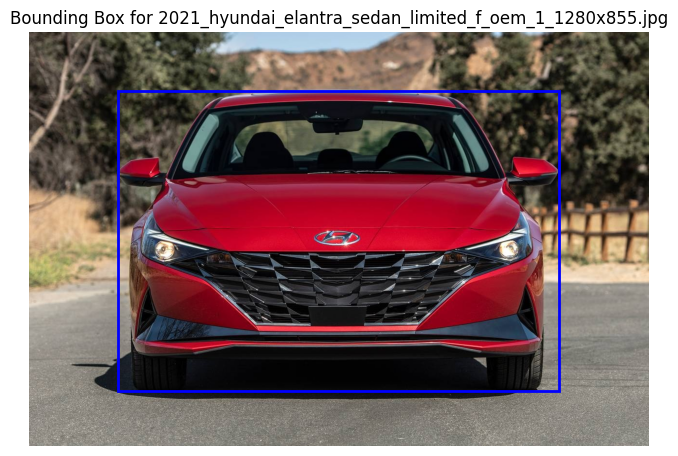

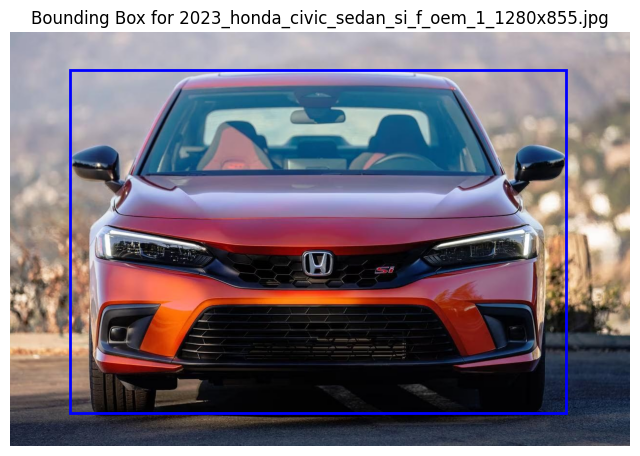

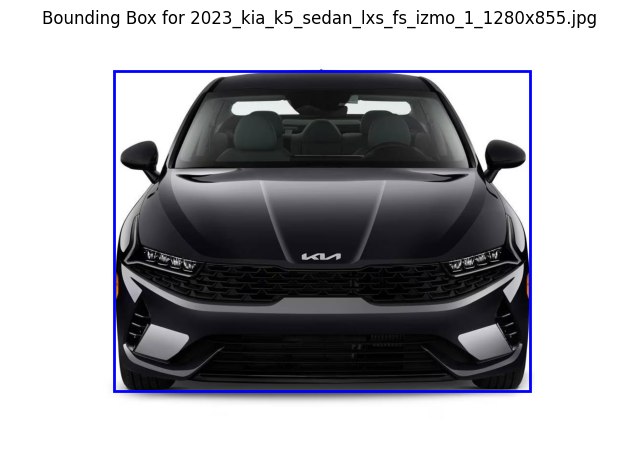

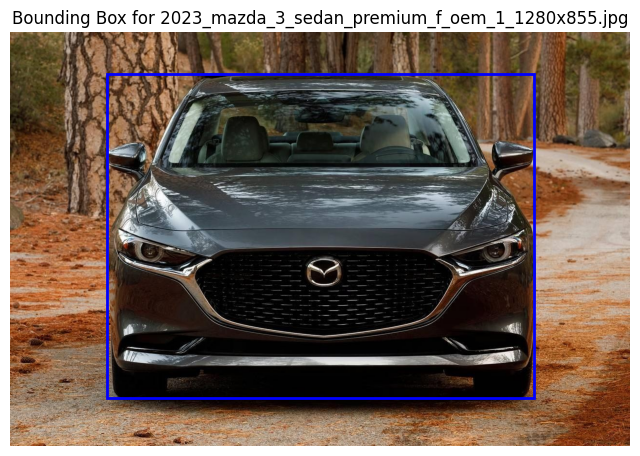

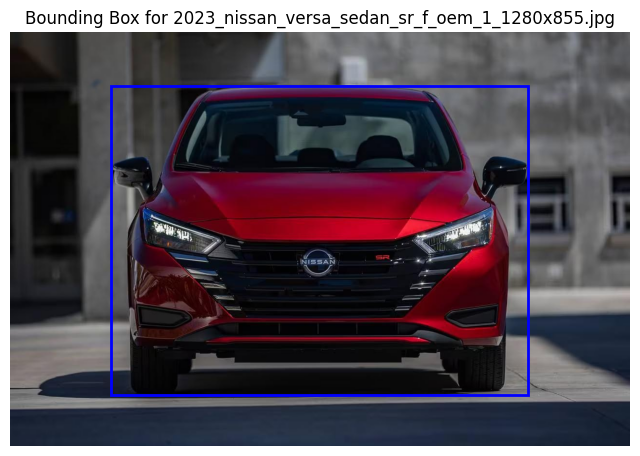

...

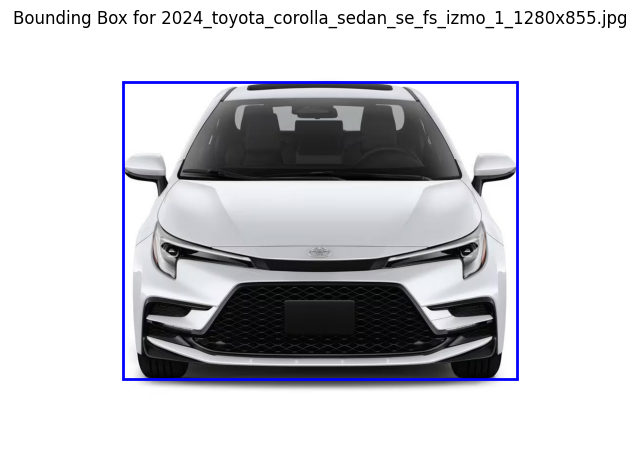

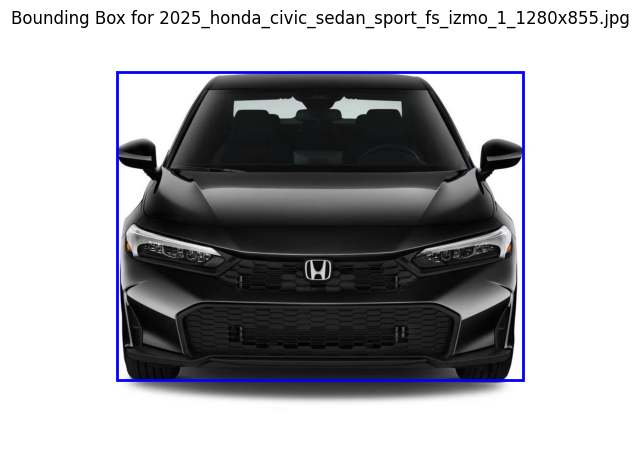

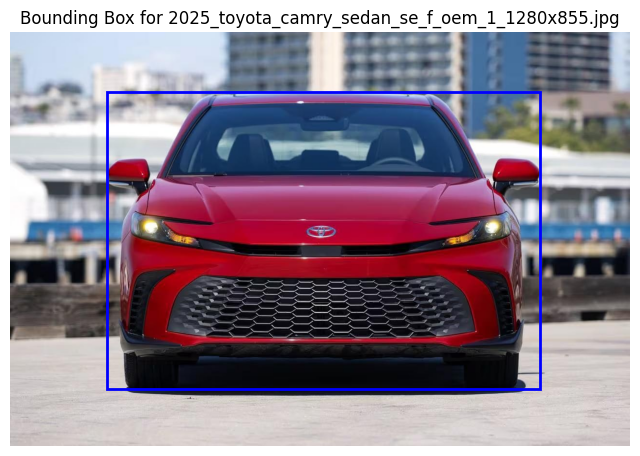

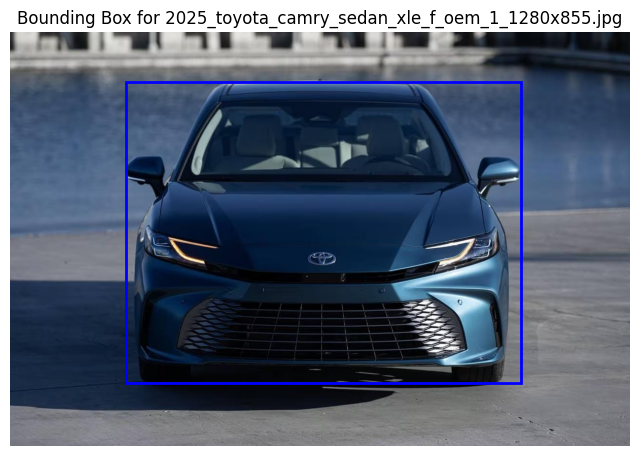

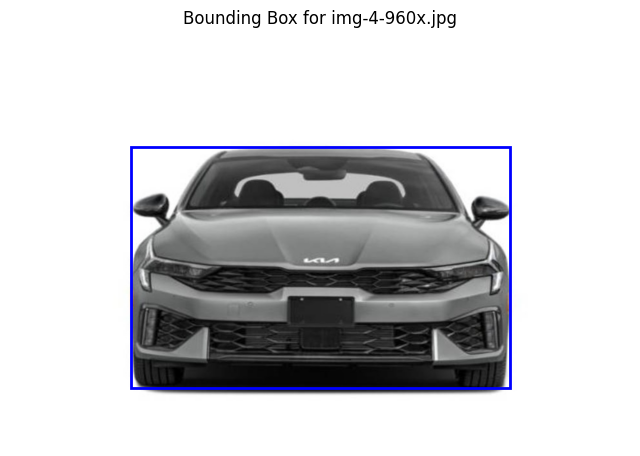

In [7]:
# File paths
csv_file_path = '/content/sample_data/Annotations/labels_my-project-name_2024-10-21-04-06-11.csv'
image_dir = "/content/sample_data/Training_Images/Resized_Images"  # Update this path to the directory containing your images

# Load the bounding box CSV file
bbox_df = pd.read_csv(csv_file_path)

# Function to parse bounding boxes from CSV
def parse_bounding_boxes(bbox_df):
    bbox_data = {}

    # Iterate through each row to extract bounding box details
    for index, row in bbox_df.iterrows():
        image_id = row['Image']
        x_min = row['Bbox_x1']
        y_min = row['Bbox_y1']
        x_max = x_min + row['Bbox_width']  # Calculate x2 from width
        y_max = y_min + row['Bbox_height']  # Calculate y2 from height

        # Store the bounding box for the image
        bbox_data[image_id] = [x_min, y_min, x_max, y_max]

    return bbox_data

# Parse the bounding boxes
bounding_boxes_dict = parse_bounding_boxes(bbox_df)

# Function to plot bounding boxes on images
def plot_bounding_box(image_id, bbox):
    image_path = os.path.join(image_dir, image_id)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    try:
        # Load the image
        img = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)

        # Plot the bounding box
        x_min, y_min, x_max, y_max = bbox
        plt.gca().add_patch(plt.Rectangle(
            (x_min, y_min),  # Bottom-left corner
            x_max - x_min,   # Width
            y_max - y_min,   # Height
            edgecolor='blue',
            facecolor='none',
            linewidth=2
        ))

        # Show the plot
        plt.title(f"Bounding Box for {image_id}")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

# Display bounding boxes on images
for image_id, bbox in bounding_boxes_dict.items():
    plot_bounding_box(image_id, bbox)

    # Comment this out if you want to plot all images
    # break

### If you want to see both **keypoints** and **bounding box** on the images used for training

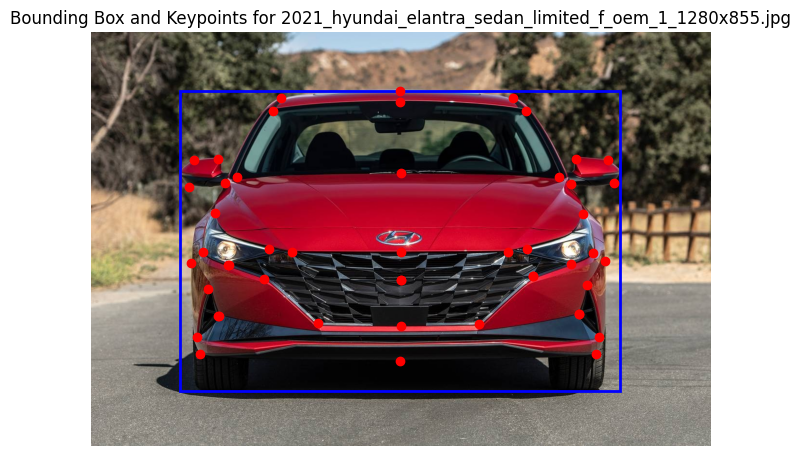

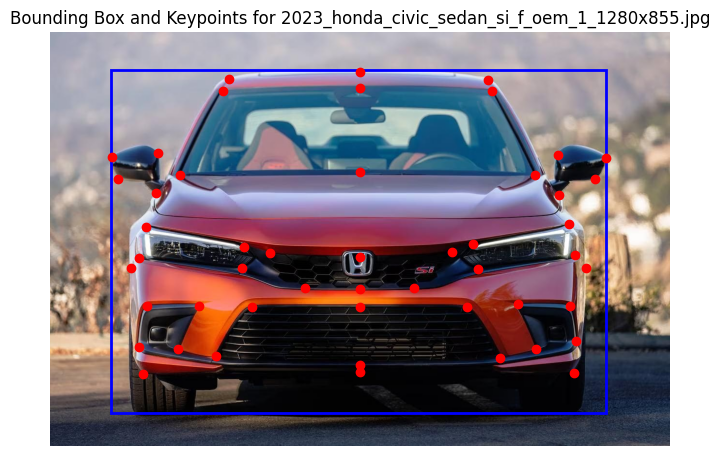

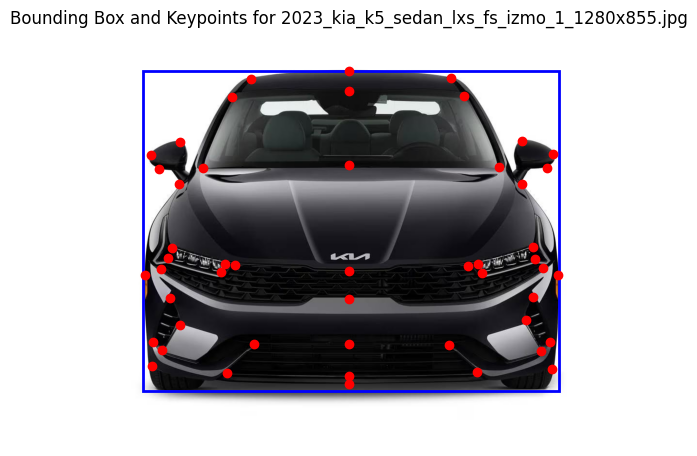

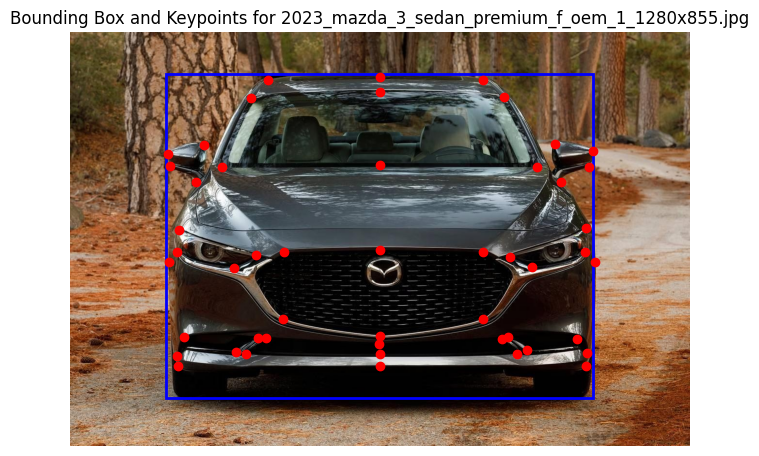

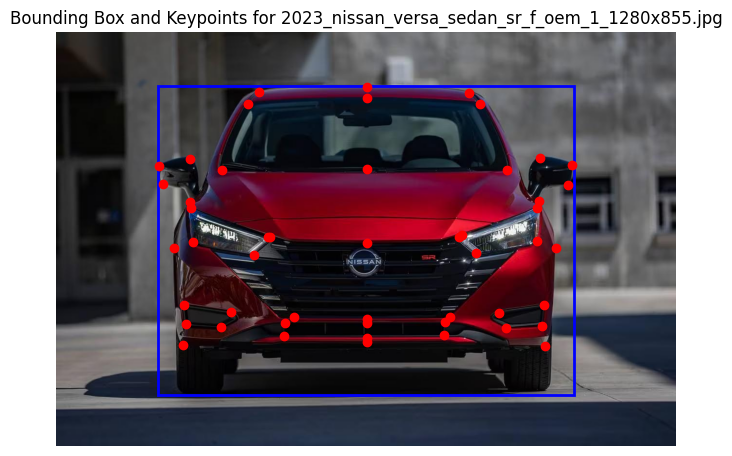

...

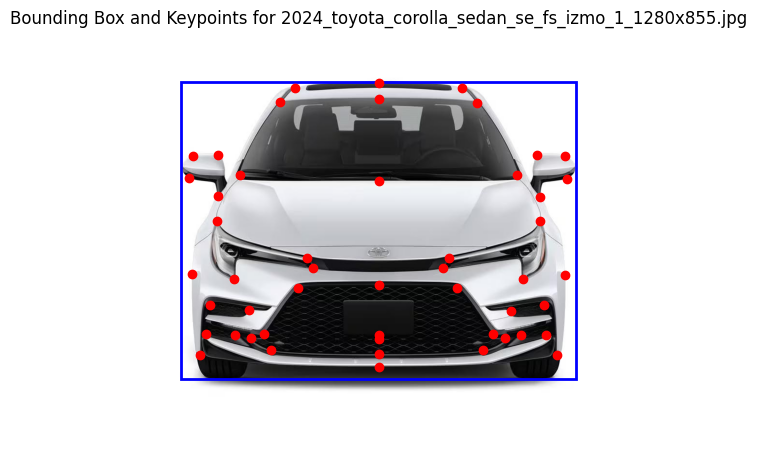

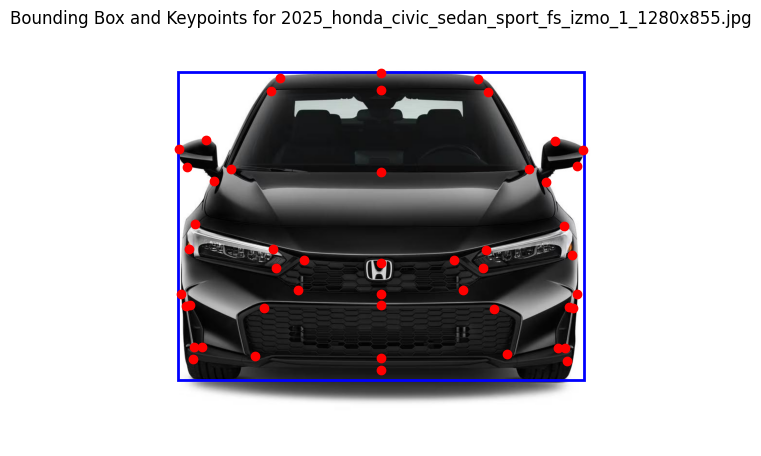

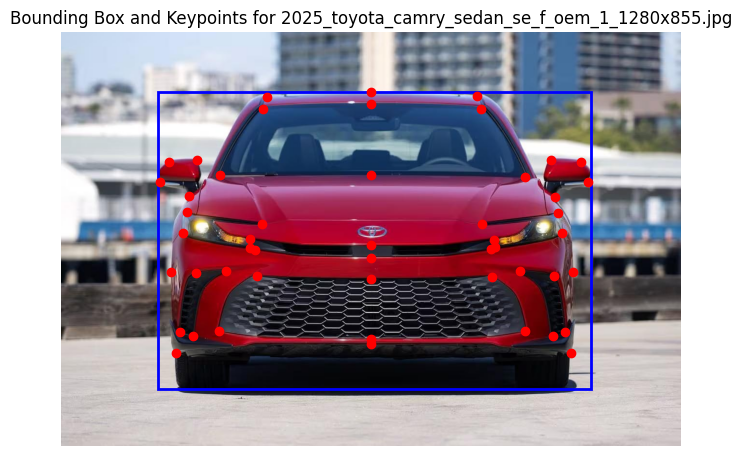

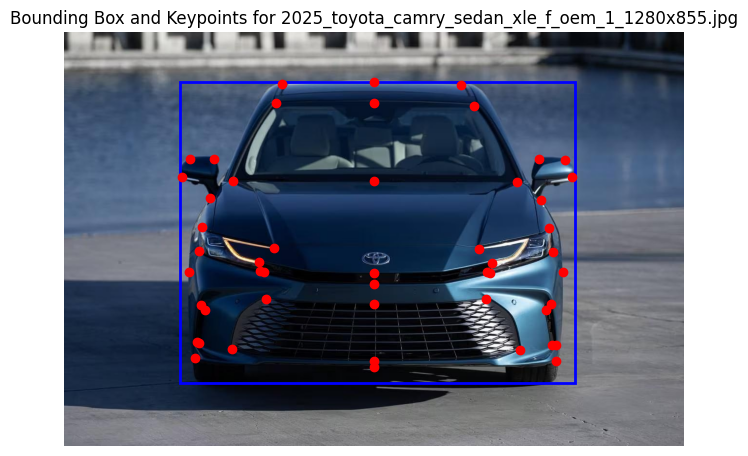

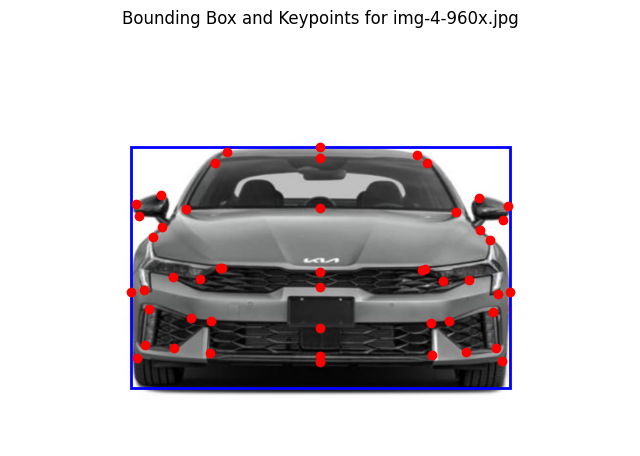

In [8]:
# File paths
csv_file_path = '/content/sample_data/Annotations/labels_my-project-name_2024-10-21-04-06-11.csv'
keypoints_csv_path = '/content/sample_data/Annotations/labels_indpt.-annotation-final_2024-09-27-11-50-18.csv'  # Replace with actual keypoints file path
image_dir = "/content/sample_data/Training_Images/Resized_Images"  # Update this path to the directory containing your images

# Load the bounding box CSV file
bbox_df = pd.read_csv(csv_file_path)
keypoints_df = pd.read_csv(keypoints_csv_path)

# Function to parse bounding boxes from CSV
def parse_bounding_boxes(bbox_df):
    bbox_data = {}

    # Iterate through each row to extract bounding box details
    for index, row in bbox_df.iterrows():
        image_id = row['Image']
        x_min = row['Bbox_x1']
        y_min = row['Bbox_y1']
        x_max = x_min + row['Bbox_width']  # Calculate x2 from width
        y_max = y_min + row['Bbox_height']  # Calculate y2 from height

        # Store the bounding box for the image
        bbox_data[image_id] = [x_min, y_min, x_max, y_max]

    return bbox_data

# Parse the bounding boxes
bounding_boxes_dict = parse_bounding_boxes(bbox_df)

# Function to parse keypoints from CSV
def parse_keypoints(keypoints_df):
    keypoint_data = {}

    # Group by image and extract keypoints
    for image, group in keypoints_df.groupby('Image'):
        keypoints = group[['x_coord', 'y_coord']].values  # Adjust column names if different
        keypoint_data[image] = keypoints.astype(float)

    return keypoint_data

# Parse the keypoints
keypoints_dict = parse_keypoints(keypoints_df)

# Function to plot bounding boxes and keypoints on images
def plot_bounding_box_and_keypoints(image_id, bbox, keypoints=None):
    image_path = os.path.join(image_dir, image_id)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    try:
        # Load the image
        img = Image.open(image_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)

        # Plot the bounding box
        x_min, y_min, x_max, y_max = bbox
        plt.gca().add_patch(plt.Rectangle(
            (x_min, y_min),  # Bottom-left corner
            x_max - x_min,   # Width
            y_max - y_min,   # Height
            edgecolor='blue',
            facecolor='none',
            linewidth=2
        ))

        # Plot the keypoints if available
        if keypoints is not None:
            x_coords, y_coords = keypoints[:, 0], keypoints[:, 1]
            plt.scatter(x_coords, y_coords, color='red', marker='o', label='Keypoints')

        # Show the plot
        plt.title(f"Bounding Box and Keypoints for {image_id}")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

# Display bounding boxes and keypoints on images
for image_id, bbox in bounding_boxes_dict.items():
    keypoints = keypoints_dict.get(image_id, None)
    plot_bounding_box_and_keypoints(image_id, bbox, keypoints)

    # Comment this out if you want to plot all images
    # break

## Model 1 (using Hybrid CNN and ViT architecture) - **using Bounding Box** as well

### Setting up architecture and training the model

In [9]:
"""
Car Keypoints and Bounding Box Detection: Training and Fine-Tuning

This script focuses on training and fine-tuning a deep learning model for detecting car bounding boxes
and keypoints. It includes the following features:

1. **Dataset Preparation:**
   - Merges bounding box and keypoints annotations into a single dataset.
   - Splits data into training and validation sets.
   - Normalizes bounding box and keypoint coordinates for consistency.

2. **Model Architecture:**
   - Utilizes a hybrid approach combining a ResNet-34 backbone for feature extraction and
     a Vision Transformer (ViT) for global context understanding.
   - A fully connected layer outputs bounding box and keypoint predictions.

3. **Training Phases:**
   - Phase 1: Focuses on optimizing bounding box predictions with higher weight on the bounding box loss.
   - Phase 2: Fine-tunes the model, balancing bounding box and keypoint prediction accuracy.

4. **Loss Functions and Optimization:**
   - Implements separate loss functions (Mean Squared Error) for bounding box and keypoint predictions.
   - Employs a multi-loss strategy with tunable weights for bounding box and keypoint accuracy.

5. **Training and Validation:**
   - Trains the model using Adam optimizer with specific learning rates for each phase.
   - Provides detailed logging for loss metrics across training and validation phases.

Usage:
- Update paths for datasets, images, and annotations.
- Customize hyperparameters such as learning rates, batch size, and loss weights for your use case.

"""


# Re-import (optional)
bounding_box_df = pd.read_csv('/content/sample_data/Annotations/labels_my-project-name_2024-10-21-04-06-11.csv')  # Replace with your file path
keypoints_df = pd.read_csv('/content/sample_data/Annotations/labels_indpt.-annotation-final_2024-09-27-11-50-18.csv')  # Replace with your file path

# Merge the keypoints and bounding boxes into one DataFrame based on the 'Image' column
merged_data = pd.merge(keypoints_df, bounding_box_df, on='Image')

class CarKeypointsAndBboxDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.grouped_data = dataframe.groupby('Image')
        self.image_dir = image_dir
        self.transform = transform
        self.image_names = list(self.grouped_data.groups.keys())

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        image_path = f'{self.image_dir}/{image_name}'

        image = Image.open(image_path).convert('RGB')
        image_data = self.grouped_data.get_group(image_name)

        bbox_data = image_data[image_data['Label_y'] == 'Bounding Box'].iloc[0]
        bounding_box = np.array([bbox_data['Bbox_x1'], bbox_data['Bbox_y1'],
                                 bbox_data['Bbox_width'], bbox_data['Bbox_height']], dtype=np.float32)
        bounding_box = np.pad(bounding_box, (0, 4 - len(bounding_box)), 'constant', constant_values=0)

        keypoints_data = image_data[image_data['Label_x'] != 'Bounding Box']
        keypoints = keypoints_data[['x_coord', 'y_coord']].values.flatten().astype(np.float32)
        keypoints = np.pad(keypoints, (0, 100 - len(keypoints)), 'constant', constant_values=0)

        if self.transform:
            image = self.transform(image)

        bounding_box[0] /= 1280
        bounding_box[1] /= 850
        bounding_box[2] /= 1280
        bounding_box[3] /= 850
        keypoints[0::2] /= 1280
        keypoints[1::2] /= 850

        return image, torch.tensor(bounding_box, dtype=torch.float32), torch.tensor(keypoints, dtype=torch.float32)

# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
# Prepare data for training (split into train/validation)
# Get unique image names
unique_images = merged_data['Image'].unique()

# Split the image names into training and validation sets
train_images = pd.Series(unique_images).sample(frac=0.9, random_state=42)
val_images = pd.Series(unique_images).drop(train_images.index)

# Filter merged_data to create train_data and val_data based on image names
train_data = merged_data[merged_data['Image'].isin(train_images)]
val_data = merged_data[merged_data['Image'].isin(val_images)]

# Create dataset instances
train_dataset = CarKeypointsAndBboxDataset(train_data, image_dir='/content/sample_data/Training_Images/Resized_Images', transform=transform)
val_dataset = CarKeypointsAndBboxDataset(val_data, image_dir='/content/sample_data/Training_Images/Resized_Images', transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

class KeypointAndBboxModel(nn.Module):
    def __init__(self, num_keypoints=50):
        super(KeypointAndBboxModel, self).__init__()

        # Backbone: Pretrained ResNet to extract features
        resnet = models.resnet34(pretrained=True)
        self.resnet_backbone = nn.Sequential(*list(resnet.children())[:-2])  # Exclude last FC layer and avg pool

        # Transformer block for capturing global context
        self.transformer = vit_b_16(pretrained=True)
        self.transformer.heads = nn.Identity()  # Remove transformer classification head

        # Feature fusion (concatenate CNN and Transformer features)
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512 * 7 * 7 + 768, 1024),  # Adjust input size based on ResNet and Transformer output
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(1024, 4 + num_keypoints * 2),  # Output for bounding box and keypoints
            nn.Sigmoid()  # To keep output between 0 and 1 for normalization
        )

    def forward(self, x):
        # ResNet backbone forward pass
        resnet_features = self.resnet_backbone(x)

        # Vision Transformer forward pass
        transformer_features = self.transformer(x)

        # Concatenate CNN and Transformer features
        combined_features = torch.cat([resnet_features.flatten(1), transformer_features.flatten(1)], dim=1)

        # Fully connected layers to predict bounding box and keypoints
        output = self.fc(combined_features)

        return output

# Instantiate model
model = KeypointAndBboxModel(num_keypoints=50)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Define Loss Functions and Optimizer

# Define Loss Functions and Optimizer with lower learning rate
criterion_bbox = nn.MSELoss()
criterion_keypoints = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=1e-5)  # Lower learning rate

def train_model_debug(model, train_loader, val_loader, criterion_bbox, criterion_keypoints, optimizer, num_epochs, bbox_weight, keypoint_weight, phase_name=""):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_bbox_loss = 0.0
        running_keypoint_loss = 0.0

        for images, bounding_boxes, keypoints in train_loader:
            # Move images and targets to the same device as the model
            images = images.to(device)
            bounding_boxes = bounding_boxes.to(device)
            keypoints = keypoints.to(device)

            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)
            bbox_preds, keypoint_preds = outputs[:, :4], outputs[:, 4:]

            # Clipping predictions to stay within expected range [0, 1]
            bbox_preds = torch.clamp(bbox_preds, 0, 1)
            keypoint_preds = torch.clamp(keypoint_preds, 0, 1)

            # Compute losses
            loss_bbox = criterion_bbox(bbox_preds, bounding_boxes) * bbox_weight
            loss_keypoints = criterion_keypoints(keypoint_preds, keypoints) * keypoint_weight
            loss = loss_bbox + loss_keypoints

            # Track individual losses
            running_bbox_loss += loss_bbox.item()
            running_keypoint_loss += loss_keypoints.item()

            # Backward pass and optimization
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            running_loss += loss.item()

        print(f"[{phase_name}] Epoch {epoch+1}/{num_epochs}, Total Loss: {running_loss/len(train_loader):.4f}, "
              f"BBox Loss: {running_bbox_loss/len(train_loader):.4f}, Keypoint Loss: {running_keypoint_loss/len(train_loader):.4f}")

        # Validation phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, bounding_boxes, keypoints in val_loader:
                images = images.to(device)
                bounding_boxes = bounding_boxes.to(device)
                keypoints = keypoints.to(device)

                outputs = model(images)
                bbox_preds, keypoint_preds = outputs[:, :4], outputs[:, 4:]

                # Clipping predictions for validation as well
                bbox_preds = torch.clamp(bbox_preds, 0, 1)
                keypoint_preds = torch.clamp(keypoint_preds, 0, 1)

                loss_bbox = criterion_bbox(bbox_preds, bounding_boxes) * bbox_weight
                loss_keypoints = criterion_keypoints(keypoint_preds, keypoints) * keypoint_weight
                loss = loss_bbox + loss_keypoints
                val_loss += loss.item()
        print(f"[{phase_name}] Validation Loss: {val_loss/len(val_loader):.4f}")

# Phase 1: Train primarily for bounding box detection
optimizer_phase1 = optim.Adam(model.parameters(), lr=0.00017809534390654253)
train_model_debug(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion_bbox=criterion_bbox,
    criterion_keypoints=criterion_keypoints,
    optimizer=optimizer_phase1,
    num_epochs=100,  # Focusing on bounding box prediction
    bbox_weight=6.628931626601238,
    keypoint_weight=0.008999673660191455,
    phase_name="Bounding Box Focus Phase"
)

# Phase 2: Fine-tuning with higher emphasis on keypoints
optimizer_phase2 = optim.Adam(model.parameters(), lr=8.75068256025535e-05)  # Lower learning rate for precision tuning
train_model_debug(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion_bbox=criterion_bbox,
    criterion_keypoints=criterion_keypoints,
    optimizer=optimizer_phase2,
    num_epochs = 200,  # Extended fine-tuning
    bbox_weight=1.2813941620499145,  # Lower bbox weight to shift focus on keypoints
    keypoint_weight=1.1204285652365555,
    phase_name="Fine-tuning Phase"
)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weig

[Bounding Box Focus Phase] Epoch 1/100, Total Loss: 0.5938, BBox Loss: 0.5933, Keypoint Loss: 0.0005
[Bounding Box Focus Phase] Validation Loss: 0.3466
[Bounding Box Focus Phase] Epoch 2/100, Total Loss: 0.4244, BBox Loss: 0.4232, Keypoint Loss: 0.0012
[Bounding Box Focus Phase] Validation Loss: 0.3466
[Bounding Box Focus Phase] Epoch 3/100, Total Loss: 0.4102, BBox Loss: 0.4088, Keypoint Loss: 0.0013
[Bounding Box Focus Phase] Validation Loss: 0.7212
[Bounding Box Focus Phase] Epoch 4/100, Total Loss: 0.6696, BBox Loss: 0.6683, Keypoint Loss: 0.0014
[Bounding Box Focus Phase] Validation Loss: 0.1775
[Bounding Box Focus Phase] Epoch 5/100, Total Loss: 0.6076, BBox Loss: 0.6063, Keypoint Loss: 0.0013
[Bounding Box Focus Phase] Validation Loss: 0.3467
[Bounding Box Focus Phase] Epoch 6/100, Total Loss: 0.4047, BBox Loss: 0.4034, Keypoint Loss: 0.0013
[Bounding Box Focus Phase] Validation Loss: 0.3467
[Bounding Box Focus Phase] Epoch 7/100, Total Loss: 0.4155, BBox Loss: 0.4142, Keypoint 

### Inference (Prediction)

Keypoint 0: (x, y) = (622.689697265625, 143.34475708007812)
Keypoint 1: (x, y) = (638.1002807617188, 164.0747833251953)
Keypoint 2: (x, y) = (656.4520263671875, 298.4867858886719)
Keypoint 3: (x, y) = (632.5449829101562, 440.89581298828125)
Keypoint 4: (x, y) = (629.7347412109375, 518.1119995117188)
Keypoint 5: (x, y) = (650.7611694335938, 538.83447265625)
Keypoint 6: (x, y) = (616.8164672851562, 632.6932373046875)
Keypoint 7: (x, y) = (660.064208984375, 651.2510986328125)
Keypoint 8: (x, y) = (448.8604431152344, 143.41026306152344)
Keypoint 9: (x, y) = (833.3071899414062, 154.49618530273438)
Keypoint 10: (x, y) = (421.6134033203125, 168.69833374023438)
Keypoint 11: (x, y) = (856.1591796875, 173.87158203125)
Keypoint 12: (x, y) = (341.797607421875, 311.1047668457031)
Keypoint 13: (x, y) = (930.0835571289062, 302.64019775390625)
Keypoint 14: (x, y) = (245.57028198242188, 269.78680419921875)
Keypoint 15: (x, y) = (309.0114440917969, 267.16119384765625)
Keypoint 16: (x, y) = (246.65853881

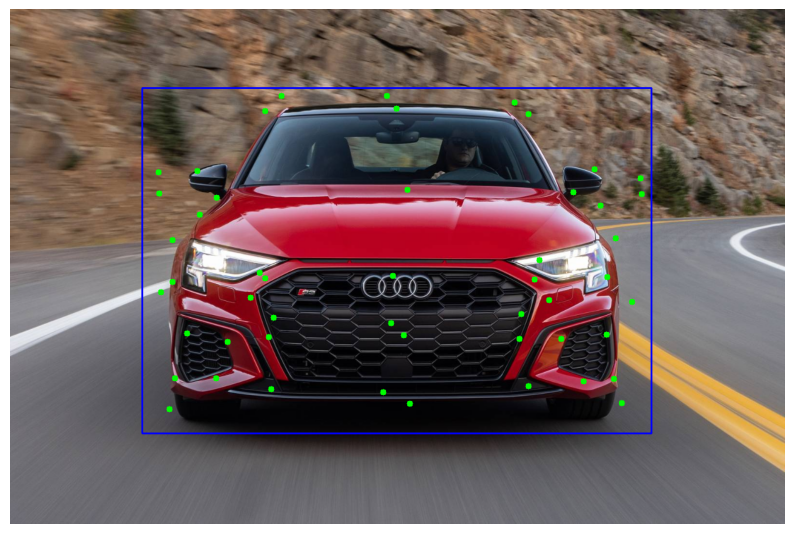

Keypoint 0: (x, y) = (633.2191162109375, 157.34310913085938)
Keypoint 1: (x, y) = (639.34423828125, 177.6562957763672)
Keypoint 2: (x, y) = (646.715576171875, 307.71844482421875)
Keypoint 3: (x, y) = (632.6232299804688, 445.86077880859375)
Keypoint 4: (x, y) = (633.8753662109375, 530.2632446289062)
Keypoint 5: (x, y) = (643.17236328125, 552.7421264648438)
Keypoint 6: (x, y) = (622.8956298828125, 634.242431640625)
Keypoint 7: (x, y) = (655.2499389648438, 652.7607421875)
Keypoint 8: (x, y) = (459.2364196777344, 156.4779510498047)
Keypoint 9: (x, y) = (827.2454223632812, 168.08935546875)
Keypoint 10: (x, y) = (431.38232421875, 184.3636016845703)
Keypoint 11: (x, y) = (840.787353515625, 184.4351043701172)
Keypoint 12: (x, y) = (358.6473083496094, 316.653564453125)
Keypoint 13: (x, y) = (922.0659790039062, 308.3600769042969)
Keypoint 14: (x, y) = (263.1846008300781, 278.2506103515625)
Keypoint 15: (x, y) = (321.23150634765625, 273.0574645996094)
Keypoint 16: (x, y) = (263.4336853027344, 311

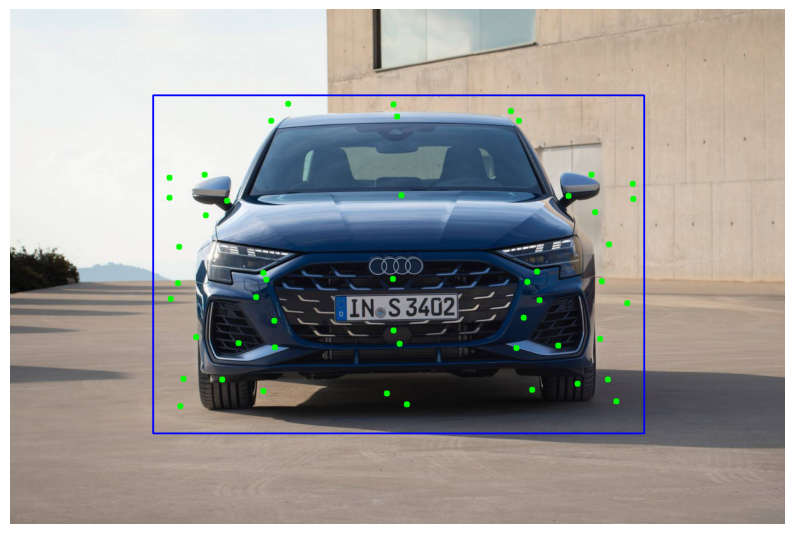

In [10]:
"""
Inference and Visualization for Car Keypoints and Bounding Box Detection

This script provides functionality to:
1. Predict bounding box and keypoint coordinates for car images using a trained model.
2. Scale the predictions back to the original image dimensions for accurate visualization.
3. Enforce constraints to ensure predicted keypoints lie within the detected bounding box.
4. Visualize the results by overlaying bounding boxes and keypoints on the original image.

Key Functions:
- `predict_keypoints_and_bbox`: Generates predictions for bounding box and keypoints using the trained model.
- `enforce_keypoint_within_bbox`: Adjusts keypoints to ensure they remain inside the bounding box.
- `plot_keypoints_and_bbox_debug`: Visualizes the predictions on the original image with bounding boxes and keypoints.

Usage:
- Update the `image_name` and `image_path` variables with the path to your test image.
- Ensure the trained model and required transformations are loaded before inference.
- Run the script to visualize the predictions for the test image.

Dependencies:
- PyTorch: For inference using the trained model.
- OpenCV: For drawing bounding boxes and keypoints.
- Matplotlib: For displaying the visualized results.

"""



# Define the prediction function with device adjustments
def predict_keypoints_and_bbox(image_path, model):
    model.eval()  # Set the model to evaluation mode
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)  # Move image tensor to the same device as the model

    with torch.no_grad():
        predictions = model(image_tensor)

    # Move predictions to CPU for further processing
    bbox = predictions[0, :4].cpu().numpy()  # Bounding box predictions
    keypoints = predictions[0, 4:].cpu().numpy().reshape(-1, 2)  # Keypoints predictions

    # Scale back to the original dimensions (1280x850)
    bbox[0] *= 1280  # x_min
    bbox[1] *= 850   # y_min
    bbox[2] *= 1280  # width
    bbox[3] *= 850   # height
    keypoints[:, 0] *= 1280  # x coordinates
    keypoints[:, 1] *= 850   # y coordinates

    # Clip bounding box and keypoints within image bounds
    bbox[0] = np.clip(bbox[0], 0, 1280)
    bbox[1] = np.clip(bbox[1], 0, 850)
    bbox[2] = np.clip(bbox[2], 100, 1280 - bbox[0])
    bbox[3] = np.clip(bbox[3], 100, 850 - bbox[1])
    keypoints[:, 0] = np.clip(keypoints[:, 0], 0, 1280)
    keypoints[:, 1] = np.clip(keypoints[:, 1], 0, 850)

    return bbox, keypoints

# Enforce keypoints within bounding box
def enforce_keypoint_within_bbox(bbox, keypoints):
    x_min, y_min, width, height = bbox
    x_max, y_max = x_min + width, y_min + height
    keypoints[:, 0] = np.clip(keypoints[:, 0], x_min, x_max)
    keypoints[:, 1] = np.clip(keypoints[:, 1], y_min, y_max)
    return keypoints

def plot_keypoints_and_bbox_debug(image_path, bbox, keypoints):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (1280, 850))

    x_min, y_min, width, height = bbox
    cv2.rectangle(image, (int(x_min), int(y_min)),
                  (int(x_min + width), int(y_min + height)), (255, 0, 0), 2)

    for i, (x, y) in enumerate(keypoints):
        print(f"Keypoint {i}: (x, y) = ({x}, {y})")
        cv2.circle(image, (int(x), int(y)), radius=5, color=(0, 255, 0), thickness=-1)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

# Perform inference on Image 1 and plot results
image_name = '2022_audi_s3_sedan_prestige_f_oem_1_1600x1067.jpg'  # Replace with your test image file
image_path = f'/content/sample_data/Inference_Images/{image_name}'

# Predict and enforce bounding box constraints
predicted_bbox_1, predicted_keypoints_1 = predict_keypoints_and_bbox(image_path, model)
predicted_keypoints_1 = enforce_keypoint_within_bbox(predicted_bbox_1, predicted_keypoints_1)

# Plot
plot_keypoints_and_bbox_debug(image_path, predicted_bbox_1, predicted_keypoints_1)


# Perform inference on Image 2 and plot results
image_name = '2025_audi_s3_sedan_prestige_f_oem_2_1600x1067.jpg'  # Replace with your test image file
image_path = f'/content/sample_data/Inference_Images/{image_name}'

# Predict and enforce bounding box constraints
predicted_bbox_2, predicted_keypoints_2 = predict_keypoints_and_bbox(image_path, model)
predicted_keypoints_2 = enforce_keypoint_within_bbox(predicted_bbox_2, predicted_keypoints_2)

# Plot
plot_keypoints_and_bbox_debug(image_path, predicted_bbox_2, predicted_keypoints_2)

### If you want to save the model file (**optional**)

In [11]:
# Save the trained model (architecture + weights)
model_save_path = '/content/sample_data/Saved_models/keypoints_boundingbox_model.pth'
torch.save(model, model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to /content/sample_data/Saved_models/keypoints_boundingbox_model.pth


### Computing Euclidean distance difference between 2

In [13]:
def compute_design_difference_from_arrays(keypoints1, keypoints2):
    """
    Compute the normalized Euclidean distance between two sets of keypoints.

    :param keypoints1: A numpy array of shape (N, 2) containing (x, y) keypoints for the first image.
    :param keypoints2: A numpy array of shape (N, 2) containing (x, y) keypoints for the second image.
    :return: Total Euclidean distance between normalized keypoints of the two sets.
    """
    # Validate input shapes
    if keypoints1.shape != keypoints2.shape:
        raise ValueError("The two keypoint arrays must have the same shape.")

    # Calculate length and height for normalization
    length1 = keypoints1[:, 0].max() - keypoints1[:, 0].min()
    height1 = keypoints1[:, 1].max() - keypoints1[:, 1].min()
    length2 = keypoints2[:, 0].max() - keypoints2[:, 0].min()
    height2 = keypoints2[:, 1].max() - keypoints2[:, 1].min()

    # Normalize coordinates based on the dimensions
    keypoints1_normalized = np.copy(keypoints1)
    keypoints2_normalized = np.copy(keypoints2)

    keypoints1_normalized[:, 0] = (keypoints1[:, 0] - keypoints1[:, 0].min()) / length1
    keypoints1_normalized[:, 1] = (keypoints1[:, 1] - keypoints1[:, 1].min()) / height1

    keypoints2_normalized[:, 0] = (keypoints2[:, 0] - keypoints2[:, 0].min()) / length2
    keypoints2_normalized[:, 1] = (keypoints2[:, 1] - keypoints2[:, 1].min()) / height2

    # Compute normalized Euclidean distances for corresponding keypoints
    distances = np.sqrt(np.sum((keypoints1_normalized - keypoints2_normalized) ** 2, axis=1))

    # Aggregate distances (e.g., sum or average)
    total_distance = np.sum(distances)
    return total_distance

# Compute design difference
design_difference = compute_design_difference_from_arrays(predicted_keypoints_1, predicted_keypoints_2)
print(f"Normalized Design Difference (Total Euclidean Distance): {design_difference}")


Normalized Design Difference (Total Euclidean Distance): 0.5978766083717346


## Model 2 - Keypoint Detection Using Feature Pyramid Network (FPN) and Attention Mechanism **Without Bounding Box**

### Setting up archiecture and training the model

In [12]:
"""
Model 2 - Keypoint Detection Using Feature Pyramid Network (FPN) and Attention Mechanism Without Bounding Box

This section implements the following:
1. **Dataset Preparation:**
   - `CarKeypointsDataset`: Loads images and keypoint annotations, with optional augmentation to shift keypoints slightly.
   - Normalizes keypoints relative to image dimensions.

2. **Model Architecture:**
   - **ResNet-50 Backbone:** Extracts high-level features from input images.
   - **Feature Pyramid Network (FPN):** Enhances feature representation across scales.
   - **Attention Mechanism:** Dynamically weights spatial regions in the feature map.
   - **Fully Connected Layers:** Predicts normalized keypoint coordinates directly from attention-weighted features.

3. **Training Pipeline:**
   - Loss: Mean Squared Error (MSE) for keypoint prediction.
   - Optimizer: Adam with a learning rate of `1e-4`.
   - Augmented training data improves robustness to slight positional shifts.

4. **Workflow:**
   - Data split into training (80%) and validation (20%) subsets.
   - Input images resized to `(224, 224)` for compatibility with ResNet-50.
   - Keypoints normalized during training and scaled back during evaluation.

"""


# Define the Dataset class for keypoints
class CarKeypointsDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None, augment=False):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.augment = augment
        self.image_names = dataframe['Image'].unique()

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        image_path = f'{self.image_dir}/{image_name}'
        image = Image.open(image_path).convert('RGB')
        keypoints_data = self.dataframe[self.dataframe['Image'] == image_name][['x_coord', 'y_coord']].values.flatten().astype(np.float32)

        # Apply augmentation by shifting keypoints slightly
        if self.augment:
            shift_x, shift_y = np.random.uniform(-0.01, 0.01), np.random.uniform(-0.01, 0.01)
            keypoints_data[0::2] += shift_x
            keypoints_data[1::2] += shift_y

        # Apply transformations to the image
        if self.transform:
            image = self.transform(image)

        # Normalize keypoints by image dimensions
        keypoints_data[0::2] /= 1280  # Normalize x coordinates
        keypoints_data[1::2] /= 850   # Normalize y coordinates

        return image, torch.tensor(keypoints_data, dtype=torch.float32)

# Define the complex model architecture with Feature Pyramid Network (FPN) and Attention Mechanism
class EnhancedKeypointsModel(nn.Module):
    def __init__(self, num_keypoints=50):
        super(EnhancedKeypointsModel, self).__init__()
        resnet = models.resnet50(pretrained=True)

        # Backbone using ResNet layers
        self.resnet_backbone = nn.Sequential(
            *list(resnet.children())[:-2]  # Remove last FC and avg pool layers
        )

        # Feature Pyramid Network (FPN) for multi-scale feature extraction
        self.fpn = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((7, 7))  # Reduce to a 7x7 feature map
        )

        # Attention mechanism to focus on important regions
        self.attention = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 1, kernel_size=1),
            nn.Sigmoid()  # Output attention map between 0 and 1
        )

        # Fully connected layers for predicting keypoints
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 1024),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(1024, num_keypoints * 2),  # Predict 50 keypoints (x, y) pairs
            nn.Sigmoid()  # Output between 0 and 1 for normalized coordinates
        )

    def forward(self, x):
        # Extract features using ResNet backbone
        features = self.resnet_backbone(x)

        # Apply FPN for multi-scale features
        fpn_features = self.fpn(features)

        # Apply attention mechanism
        attention_map = self.attention(fpn_features)
        attended_features = fpn_features * attention_map  # Weight features with attention

        # Fully connected layers for keypoint prediction
        keypoints = self.fc(attended_features)
        return keypoints

# Load and split data
merged_data = pd.read_csv('/content/sample_data/Annotations/labels_indpt.-annotation-final_2024-09-27-11-50-18.csv')  # Update file path

# Split unique image names for train and validation sets
unique_images = merged_data['Image'].unique()
train_images = pd.Series(unique_images).sample(frac=0.9, random_state=42)
val_images = pd.Series(unique_images).drop(train_images.index)

# Create train and validation data subsets based on the image split
train_data = merged_data[merged_data['Image'].isin(train_images)]
val_data = merged_data[merged_data['Image'].isin(val_images)]

# Data preparation and loading
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Create PyTorch Datasets
train_dataset = CarKeypointsDataset(train_data, image_dir='/content/sample_data/Training_Images/Resized_Images', transform=transform, augment=True)
val_dataset = CarKeypointsDataset(val_data, image_dir='/content/sample_data/Training_Images/Resized_Images', transform=transform, augment=False)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Instantiate the model and set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EnhancedKeypointsModel(num_keypoints=50).to(device)

# Define the loss function and optimizer
criterion_keypoints = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Define training function
def train_keypoints_model(model, train_loader, val_loader, criterion_keypoints, optimizer, num_epochs=50):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for images, keypoints in train_loader:
            images, keypoints = images.to(device), keypoints.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss_keypoints = criterion_keypoints(outputs, keypoints)
            loss_keypoints.backward()
            optimizer.step()
            running_loss += loss_keypoints.item()

        print(f"Epoch {epoch+1}/{num_epochs}, Training Keypoints Loss: {running_loss/len(train_loader):.4f}")

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, keypoints in val_loader:
                images, keypoints = images.to(device), keypoints.to(device)
                outputs = model(images)
                loss_keypoints = criterion_keypoints(outputs, keypoints)
                val_loss += loss_keypoints.item()
        print(f"Validation Loss: {val_loss/len(val_loader):.4f}")

# Train the model
train_keypoints_model(model, train_loader, val_loader, criterion_keypoints, optimizer, num_epochs=50)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/50, Training Keypoints Loss: 0.0466
Validation Loss: 0.0496
Epoch 2/50, Training Keypoints Loss: 0.0454
Validation Loss: 0.0469
Epoch 3/50, Training Keypoints Loss: 0.0428
Validation Loss: 0.0409
Epoch 4/50, Training Keypoints Loss: 0.0379
Validation Loss: 0.0298
Epoch 5/50, Training Keypoints Loss: 0.0291
Validation Loss: 0.0141
Epoch 6/50, Training Keypoints Loss: 0.0176
Validation Loss: 0.0094
Epoch 7/50, Training Keypoints Loss: 0.0156
Validation Loss: 0.0139
Epoch 8/50, Training Keypoints Loss: 0.0167
Validation Loss: 0.0102
Epoch 9/50, Training Keypoints Loss: 0.0132
Validation Loss: 0.0038
Epoch 10/50, Training Keypoints Loss: 0.0093
Validation Loss: 0.0027
Epoch 11/50, Training Keypoints Loss: 0.0089
Validation Loss: 0.0045
Epoch 12/50, Training Keypoints Loss: 0.0091
Validation Loss: 0.0056
Epoch 13/50, Training Keypoints Loss: 0.0090
Validation Loss: 0.0051
Epoch 14/50, Training Keypoints Loss: 0.0083
Validation Loss: 0.0037
Epoch 15/50, Training Keypoints Loss: 0.007

### Inference (Prediction)

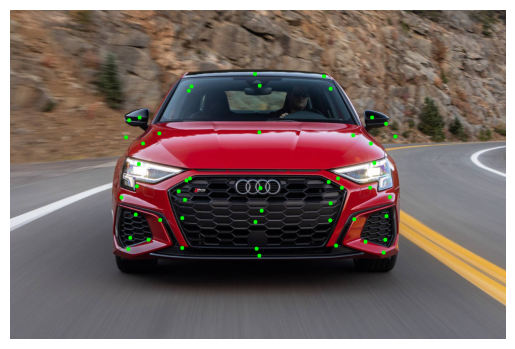

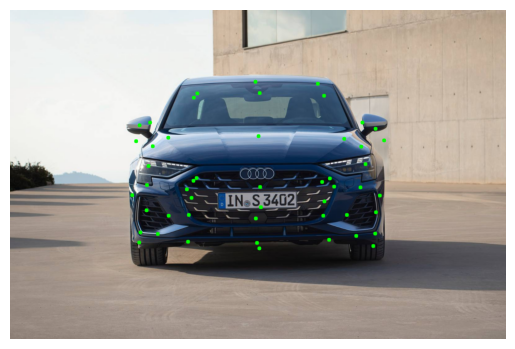

In [14]:
"""
Keypoint Prediction and Visualization

This section provides functions to:
1. **Predict Keypoints:**
   - The `predict_keypoints` function predicts keypoints for a given input image using the trained model.
   - Keypoints are normalized during training and scaled back to the original image dimensions for interpretation.

2. **Visualize Keypoints:**
   - The `plot_keypoints` function overlays the predicted keypoints onto the original image for visualization.
   - Keypoints are displayed as green circles on the image.

3. **Workflow:**
   - Load the test image and preprocess it using the same transformations as training.
   - Pass the image through the model to get predicted keypoints.
   - Scale keypoints back to the original image dimensions (1280x850) for visualization.
   - Plot the keypoints on the resized image.

**Usage:**
- Update the `image_name` and `image_path` variables with the test image path.
- Run the `predict_keypoints` function to obtain predictions.
- Use `plot_keypoints` to visualize the predicted keypoints on the test image.

"""


# Prediction function for keypoints
def predict_keypoints(image_path, model):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        predictions = model(image_tensor).cpu().numpy().reshape(-1, 2)

    # Scale keypoints back to original dimensions
    predictions[:, 0] *= 1280  # x coordinates
    predictions[:, 1] *= 850   # y coordinates

    return predictions

# Visualization function to plot keypoints on image
def plot_keypoints(image_path, keypoints):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (1280, 850))

    for x, y in keypoints:
        cv2.circle(image, (int(x), int(y)), radius=5, color=(0, 255, 0), thickness=-1)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

# Test prediction and plotting for 1st image
image_name = '2022_audi_s3_sedan_prestige_f_oem_1_1600x1067.jpg'
image_path = f'/content/sample_data/Inference_Images/{image_name}'
predicted_keypoints_1 = predict_keypoints(image_path, model)
plot_keypoints(image_path, predicted_keypoints_1)

# Test prediction and plotting for 2nd image
image_name = '2025_audi_s3_sedan_prestige_f_oem_2_1600x1067.jpg'
image_path = f'/content/sample_data/Inference_Images/{image_name}'
predicted_keypoints_2 = predict_keypoints(image_path, model)
plot_keypoints(image_path, predicted_keypoints_2)


### If you want to save the model (optional)

In [15]:
# Save the trained model (architecture + weights)
model_save_path = '/content/sample_data/Saved_models/keypoints_only_model2.pth'
torch.save(model, model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to /content/sample_data/Saved_models/keypoints_only_model2.pth


### Computing Euclidean distance difference between 2

In [15]:
def compute_design_difference_from_arrays(keypoints1, keypoints2):
    """
    Compute the normalized Euclidean distance between two sets of keypoints.

    :param keypoints1: A numpy array of shape (N, 2) containing (x, y) keypoints for the first image.
    :param keypoints2: A numpy array of shape (N, 2) containing (x, y) keypoints for the second image.
    :return: Total Euclidean distance between normalized keypoints of the two sets.
    """
    # Validate input shapes
    if keypoints1.shape != keypoints2.shape:
        raise ValueError("The two keypoint arrays must have the same shape.")

    # Calculate length and height for normalization
    length1 = keypoints1[:, 0].max() - keypoints1[:, 0].min()
    height1 = keypoints1[:, 1].max() - keypoints1[:, 1].min()
    length2 = keypoints2[:, 0].max() - keypoints2[:, 0].min()
    height2 = keypoints2[:, 1].max() - keypoints2[:, 1].min()

    # Normalize coordinates based on the dimensions
    keypoints1_normalized = np.copy(keypoints1)
    keypoints2_normalized = np.copy(keypoints2)

    keypoints1_normalized[:, 0] = (keypoints1[:, 0] - keypoints1[:, 0].min()) / length1
    keypoints1_normalized[:, 1] = (keypoints1[:, 1] - keypoints1[:, 1].min()) / height1

    keypoints2_normalized[:, 0] = (keypoints2[:, 0] - keypoints2[:, 0].min()) / length2
    keypoints2_normalized[:, 1] = (keypoints2[:, 1] - keypoints2[:, 1].min()) / height2

    # Compute normalized Euclidean distances for corresponding keypoints
    distances = np.sqrt(np.sum((keypoints1_normalized - keypoints2_normalized) ** 2, axis=1))

    # Aggregate distances (e.g., sum or average)
    total_distance = np.sum(distances)
    return total_distance

# Compute design difference
design_difference = compute_design_difference_from_arrays(predicted_keypoints_1, predicted_keypoints_2)
print(f"Normalized Design Difference (Total Euclidean Distance): {design_difference}")

Normalized Design Difference (Total Euclidean Distance): 0.28100472688674927
